# Lab 7： 基本统计学概念与市场分析应用


1. 相关性
- 皮尔逊相关系数：用于度量两个变量X与Y之间的相关（线性相关）$\rho=Cor(X,Y)=\frac{Cov(X,Y)}{\sqrt{Var(X)Var(Y)}}$
  - 若大于0，表示正向相关，小于0，表示负向相关，等于0，表示不相关。注意，这里有一个普遍的误解，认为零相关意味着没有关联。实际上，相关性只是严格衡量了两个变量之间的线性关系。比如，对于U型或V型对称函数的两个变量相关系数为0，但两个变量是存在非线性的关系。
- 自相关
  - 序列相关或自相关意味着数据中存在持久性或趋势性，也就是说可以从过去的数据（在某种程度上）预测未来的数据。
  - 计算自相关的一种简单方法是计算时间序列与他滞后一期（或2,3,4等期）的相关系数。
  - 计算自相关的一种正式方法是使用 Durbin-Watson 检验，该检验给出 d 统计量。这种方法测量误差 (e) 的变化、N 个数据点与其平均值之间的差异
    - d 的值始终介于 0 和 4 之间。如果 d=2，则没有自相关。如果 d 远小于 2，则存在正自相关；但是，如果它低于 1，则错误中的相似性比合理的要多。d 大于 2 越远，误差项中出现的负自相关越多。正自相关或序列相关意味着正误差因素很有可能跟随另一个正误差因素。



2. t检验
- t分布理论来推论差异发生的概率，从而比较两个平均数的差异是否显著,适用于样本容量较小（n<30），而总体标准差未知的正态分布。
- 当分布中使用较少的价格或交易时，我们可以预期曲线的形状会更加多变。例如，它可能被分散开，这样分布的峰值会更低，而尾部会更高。t 检验根据其自由度 (df) 计算，即 n – 1，其中 n 是样本大小，即分布中使用的价格数量： $t=价格变动均值/价格变动标准差*\sqrt{n}$
 - 样本中的数据越多，结果就越可靠。随着样本量 n 的增加，t 的值接近尾部区域的标准正态值
- t检验分为单样本检验、相关配对检验和独立双样本检验。
  - 单样本t检验主要检验单个样本的平均值是否等于目标值，如某只个股在某段时间周期内的平均收益率是否等于市场平均收益率（如上证综指）。
  - 相关配对t检验是检验相关或配对观测之差的平均值是否等于目标值，如为了检测业绩增长公告是否能带来超额收益，对发布业绩增长公告的公司公告前N日（如N=3）和公告后N日的收益率进行比较，检验是否存在显著差异。
  - 独立双样本检验是检验两个独立样本的平均值之差是否等于目标值，如检验某个交易策略在不同的交易期间内是否表现一致

In [2]:
import sys
!{sys.executable} -m pip install tushare

  Using cached tushare-1.2.85-py3-none-any.whl (130 kB)
  Using cached bs4-0.0.1-py3-none-any.whl
  Using cached websocket_client-0.57.0-py2.py3-none-any.whl (200 kB)


In [3]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns 
import tushare as ts 
import qstock as qs 
sns.set_style("darkgrid")
from pylab import mpl
mpl.rcParams['font.sans-serif']=['SimHei']
mpl.rcParams['axes.unicode_minus']=False

---
#### Exercise 1:
- np.random and normal distribution 

[ 0.56546503 -0.79228602 -1.18527991 ...  0.62341593  0.01037399
 -0.7097318 ]
count    10000.000000
mean        -0.008322
std          1.004239
min         -3.717860
25%         -0.690330
50%         -0.009052
75%          0.682918
max          3.296262
dtype: float64


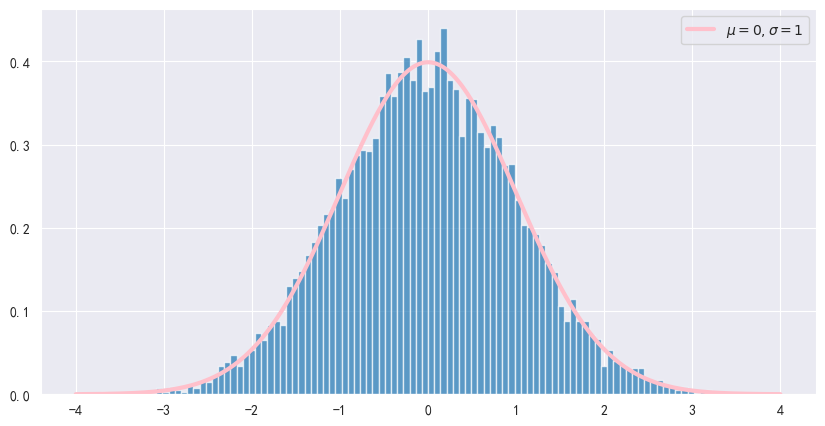

In [24]:
#计算正态分布0-1之间的概率
def normal_pdf(x,mu=0,sigma=1):
      sqrt_two_pi=np.sqrt(2*np.pi)
      pdf=(np.exp(-(x-mu) ** 2 / 2 / sigma ** 2) / (sqrt_two_pi * sigma))
      return pdf 
mu = 0
sigma = 1
#绘制正态分布
plt.figure(figsize=(10,5))
sample=np.random.normal(mu,sigma,size=10000)
plt.hist(sample,bins=100,alpha=0.7,density=True)
print(sample)
print(pd.Series(sample).describe())
x = np.linspace(-4,4,300)
y=normal_pdf(x,mu,sigma)
plt.plot(x,y,color='pink',lw=3,label='$\mu=0,\sigma=1$')
plt.legend()
plt.show()



----- 
#### Exercise 2
- Describe analysis using python efinance: 是由个人打造的用于获取股票、基金、期货数据的免费开源 Python 库，你可以使用它很方便地获取数据以便更好地服务于个人的交易系统需求。


In [30]:
# some exploration of efinance 
import sys
!{sys.executable} -m pip install efinance
import efinance as ef
ef.stock.get_quote_history('600519')
# 或者用qs.get_data('601519')

,股票名称,股票代码,日期,开盘,收盘,最高,最低,成交量,成交额,振幅,涨跌幅,涨跌额,换手率
0,贵州茅台,600519,2001-08-27,-111.41,-111.20,-110.76,-111.74,406318,1.410347e+09,-0.87,0.74,0.83,56.83
1,贵州茅台,600519,2001-08-28,-111.31,-110.94,-110.91,-111.39,129647,4.634630e+08,-0.43,0.23,0.26,18.13
2,贵州茅台,600519,2001-08-29,-110.92,-111.04,-110.91,-111.09,53252,1.946890e+08,-0.16,-0.09,-0.10,7.45
3,贵州茅台,600519,2001-08-30,-111.06,-110.89,-110.81,-111.11,48013,1.775580e+08,-0.27,0.14,0.15,6.72
4,贵州茅台,600519,2001-08-31,-110.88,-110.91,-110.79,-110.95,23231,8.623100e+07,-0.14,-0.02,-0.02,3.25
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5048,贵州茅台,600519,2022-10-11,1789.00,1779.99,1806.00,1760.00,32047,5.712250e+09,2.58,-0.34,-6.01,0.26
5049,贵州茅台,600519,2022-10-12,1773.66,1760.00,1779.00,1708.00,48195,8.372253e+09,3.99,-1.12,-19.99,0.38
5050,贵州茅台,600519,2022-10-13,1720.46,1699.99,1735.00,1697.00,63969,1.091973e+10,2.16,-3.41,-60.01,0.51
5051,贵州茅台,600519,2022-10-14,1710.00,1737.61,1755.00,1701.94,46520,8.045033e+09,3.12,2.21,37.62,0.37


<IPython.core.display.Javascript object>

100%|██████████| 22/22 [00:24<00:00,  1.12s/it]


<IPython.core.display.Javascript object>

c:\Users\sansa\anaconda3\envs\myenv\lib\site-packages\seaborn\axisgrid.py:88: UserWarning: Glyph 19978 (\N{CJK UNIFIED IDEOGRAPH-4E0A}) missing from current font.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\sansa\anaconda3\envs\myenv\lib\site-packages\seaborn\axisgrid.py:88: UserWarning: Glyph 35777 (\N{CJK UNIFIED IDEOGRAPH-8BC1}) missing from current font.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\sansa\anaconda3\envs\myenv\lib\site-packages\seaborn\axisgrid.py:88: UserWarning: Glyph 25351 (\N{CJK UNIFIED IDEOGRAPH-6307}) missing from current font.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\sansa\anaconda3\envs\myenv\lib\site-packages\seaborn\axisgrid.py:88: UserWarning: Glyph 25968 (\N{CJK UNIFIED IDEOGRAPH-6570}) missing from current font.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\sansa\anaconda3\envs\myenv\lib\site-packages\seaborn\axisgrid.py:88: UserWarning: Glyph 28145 (\N{CJK UNIFIED IDEOGRAPH-6DF1}) missing from current font.
  sel

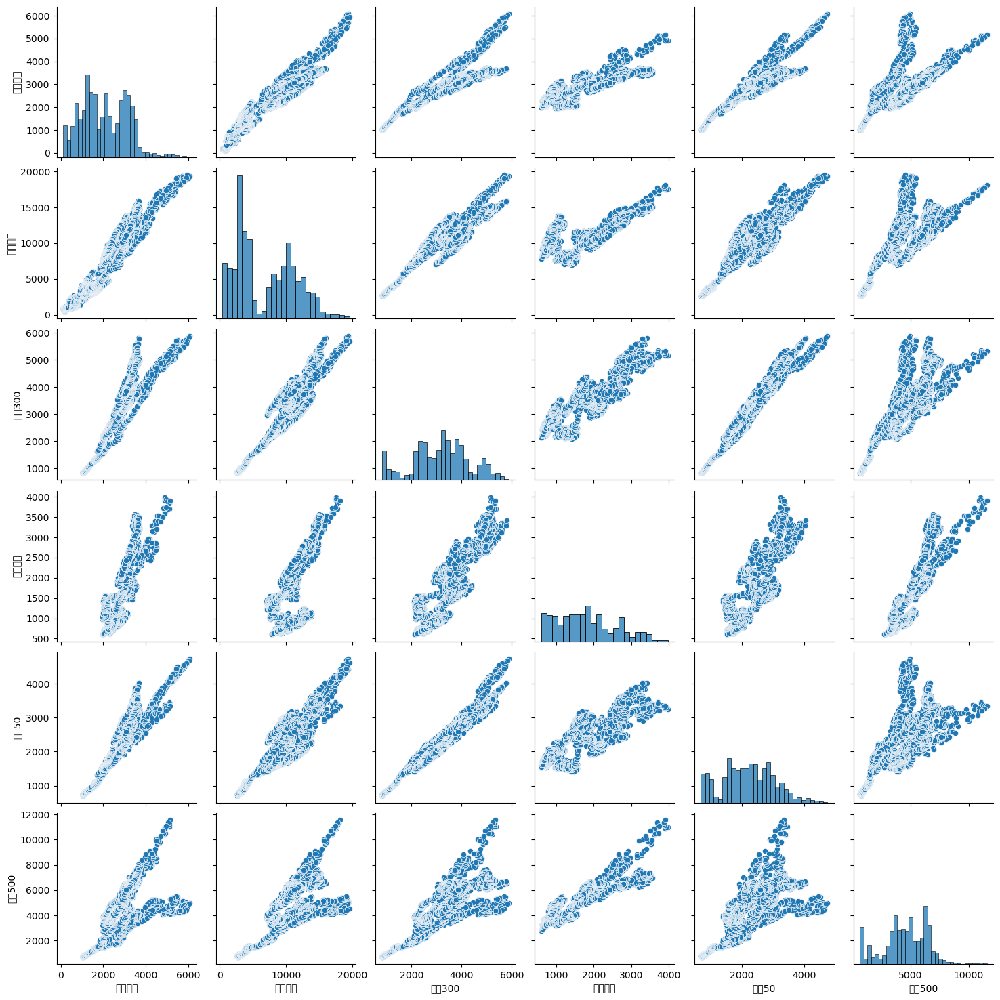

In [2]:
import efinance as ef
from tqdm import tqdm
global_indexs=['道琼斯','标普500','NDX','上证指数','深证成指','沪深300',
               '创业板指','上证50','中证500','恒生指数','英国富时','法国CAC40','德国DAX',
              '日经225','韩国KOSPI','澳大利亚标普200','印度孟买SENSEX','俄罗斯RTS','加拿大S&P',
               '台湾加权','美元指数','路透CRB商品指数']
index_data=pd.DataFrame()
for index in tqdm(global_indexs):
      index_data[index]=ef.stock.get_quote_history(index).set_index('日期')['收盘']
index_data.rename(columns={'NDX':'纳斯达克'},inplace=True)
sns.pairplot(index_data[['上证指数','深证成指','沪深300','创业板指','上证50','中证500']]);

- 从配对相关和个体分布图来看，国内各大指数存在较强的相关性，分布呈现“左偏（负偏），长右尾”的特征，即大部分时间处于较低点位数（收益低），短时间处于高点位数（异常高收益），这也反映了波动程度可能很大

In [3]:
#相关系数
cols=['沪深300','恒生指数','标普500','英国富时','法国CAC40','德国DAX','日经225','韩国KOSPI','澳大利亚标普200','印度孟买SENSEX','台湾加权']
index_data[cols].corr()

,沪深300,恒生指数,标普500,英国富时,法国CAC40,德国DAX,日经225,韩国KOSPI,澳大利亚标普200,印度孟买SENSEX,台湾加权
沪深300,1.000000,0.759461,0.665861,0.082424,0.568331,0.721772,0.638991,0.769324,0.718618,0.719690,0.739760
恒生指数,0.759461,1.000000,0.776403,0.009360,0.733785,0.882468,0.093583,0.905681,0.842658,0.816907,0.734069
标普500,0.665861,0.776403,1.000000,0.660168,0.792585,0.952696,0.446209,0.793803,0.836852,0.952119,0.927517
英国富时,0.082424,0.009360,0.660168,1.000000,0.920473,0.727333,0.640461,0.485783,0.916951,0.725218,0.619921
法国CAC40,0.568331,0.733785,0.792585,0.920473,1.000000,0.818837,0.226291,0.455740,0.679114,0.660790,0.693564
德国DAX,0.721772,0.882468,0.952696,0.727333,0.818837,1.000000,0.485493,0.868548,0.877176,0.933693,0.882196
日经225,0.638991,0.093583,0.446209,0.640461,0.226291,0.485493,1.000000,0.602032,0.844758,0.464061,0.676167
韩国KOSPI,0.769324,0.905681,0.793803,0.485783,0.455740,0.868548,0.602032,1.000000,0.885341,0.914814,0.797915
澳大利亚标普200,0.718618,0.842658,0.836852,0.916951,0.679114,0.877176,0.844758,0.885341,1.000000,0.892560,0.871979
印度孟买SENSEX,0.719690,0.816907,0.952119,0.725218,0.660790,0.933693,0.464061,0.914814,0.892560,1.000000,0.903835


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5]),
 [Text(0, 0.5, '沪深300'),
  Text(0, 1.5, '恒生指数'),
  Text(0, 2.5, '标普500'),
  Text(0, 3.5, '英国富时'),
  Text(0, 4.5, '法国CAC40'),
  Text(0, 5.5, '德国DAX'),
  Text(0, 6.5, '日经225'),
  Text(0, 7.5, '韩国KOSPI'),
  Text(0, 8.5, '澳大利亚标普200'),
  Text(0, 9.5, '印度孟买SENSEX'),
  Text(0, 10.5, '台湾加权')])

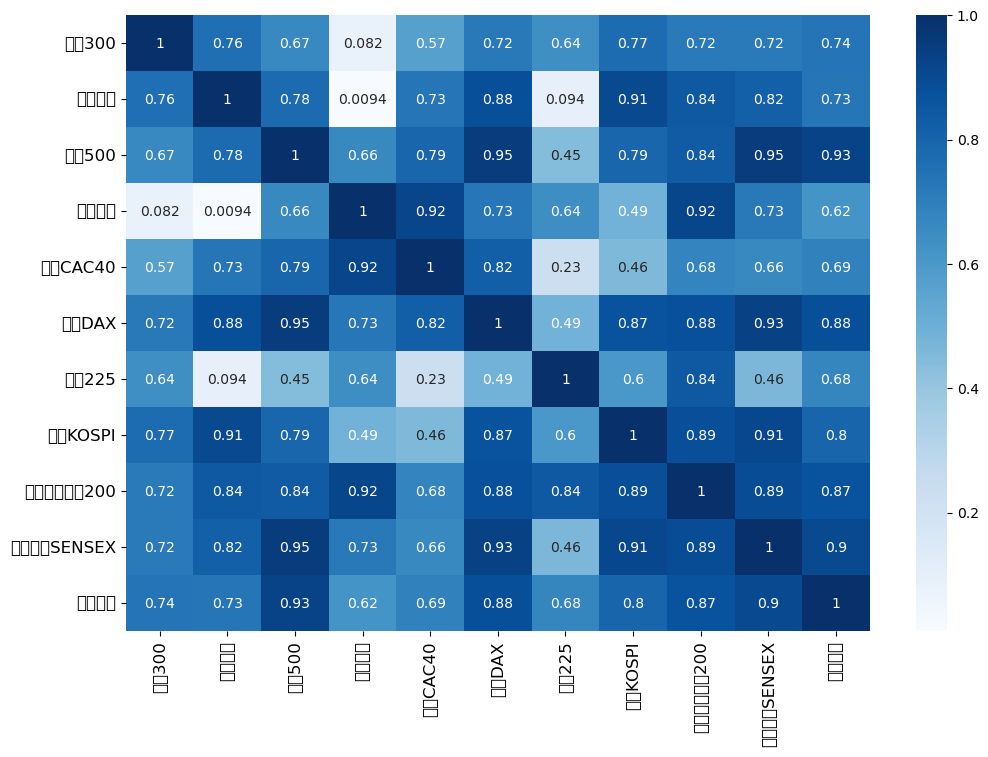

In [15]:
ax = plt.subplots(figsize=(12, 8))#画布大小
ax = sns.heatmap(index_data[cols].corr(),annot=True,cmap = "Blues")
#annot=True 表示显示系数
# 设置刻度字体大小
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)


count    880.000000
mean       0.661378
std        0.519713
min       -0.744063
25%        0.579036
50%        0.956302
75%        1.000000
max        1.000000
Name: 沪深300, dtype: float64


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

c:\Users\sansa\anaconda3\envs\myenv\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 27818 (\N{CJK UNIFIED IDEOGRAPH-6CAA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\sansa\anaconda3\envs\myenv\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 28145 (\N{CJK UNIFIED IDEOGRAPH-6DF1}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\sansa\anaconda3\envs\myenv\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 19982 (\N{CJK UNIFIED IDEOGRAPH-4E0E}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\sansa\anaconda3\envs\myenv\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 26631 (\N{CJK UNIFIED IDEOGRAPH-6807}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\sansa\anaconda3\envs\myenv\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 26222 (\N{CJK UNIFIED IDEOGRAPH-666E}) miss

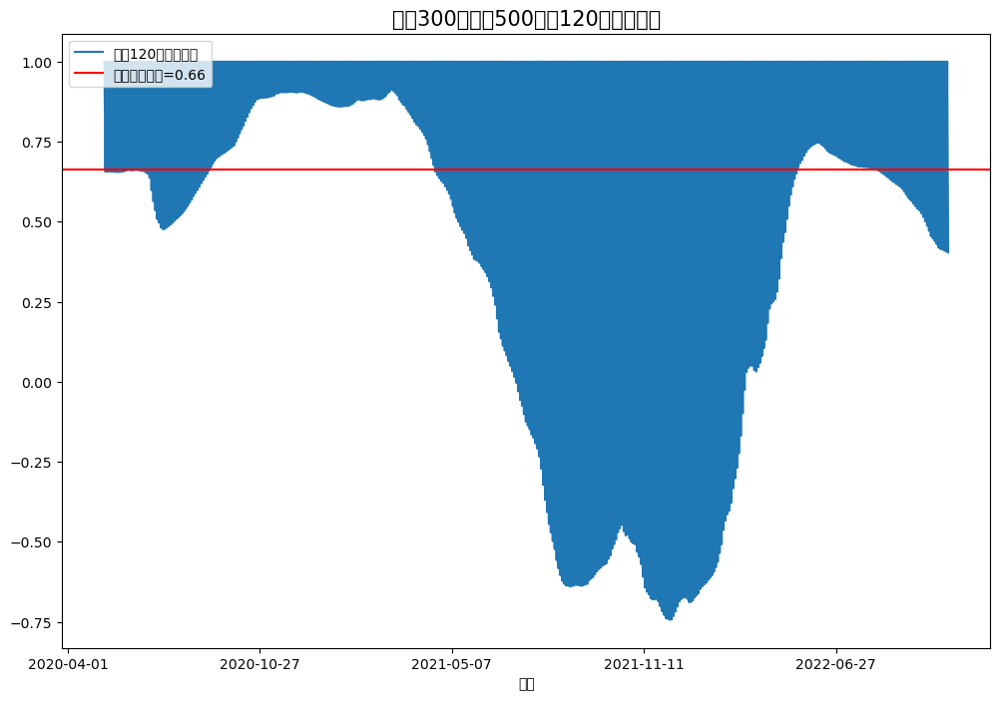

In [18]:
def cal_roll_cor(data=index_data,index1='沪深300',index2='标普500',period=120):
      data=data.dropna()
      cors=data[[index1,index2]].rolling(period).corr()
      cors=cors.reset_index()
      cors=cors.set_index('日期')
      cor=cors[index1]
      print(cor.describe())
      cor.plot(figsize=(12,8),label=f'移动{period}日相关系数')
      plt.title(f'{index1}与{index2}移动{period}日相关系数',size=15)
      plt.axhline(cor.mean(), c='r',label=f'相关系数均值={cor.mean():.2f}')
      plt.legend(loc=2)
      plt.show()
      return 
cal_roll_cor()

count    880.000000
mean       0.658975
std        0.494273
min       -0.549428
25%        0.290252
50%        0.978416
75%        1.000000
max        1.000000
Name: 创业板指, dtype: float64


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

c:\Users\sansa\anaconda3\envs\myenv\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 21019 (\N{CJK UNIFIED IDEOGRAPH-521B}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\sansa\anaconda3\envs\myenv\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 19994 (\N{CJK UNIFIED IDEOGRAPH-4E1A}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\sansa\anaconda3\envs\myenv\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 26495 (\N{CJK UNIFIED IDEOGRAPH-677F}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\sansa\anaconda3\envs\myenv\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 25351 (\N{CJK UNIFIED IDEOGRAPH-6307}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\sansa\anaconda3\envs\myenv\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 19982 (\N{CJK UNIFIED IDEOGRAPH-4E0E}) miss

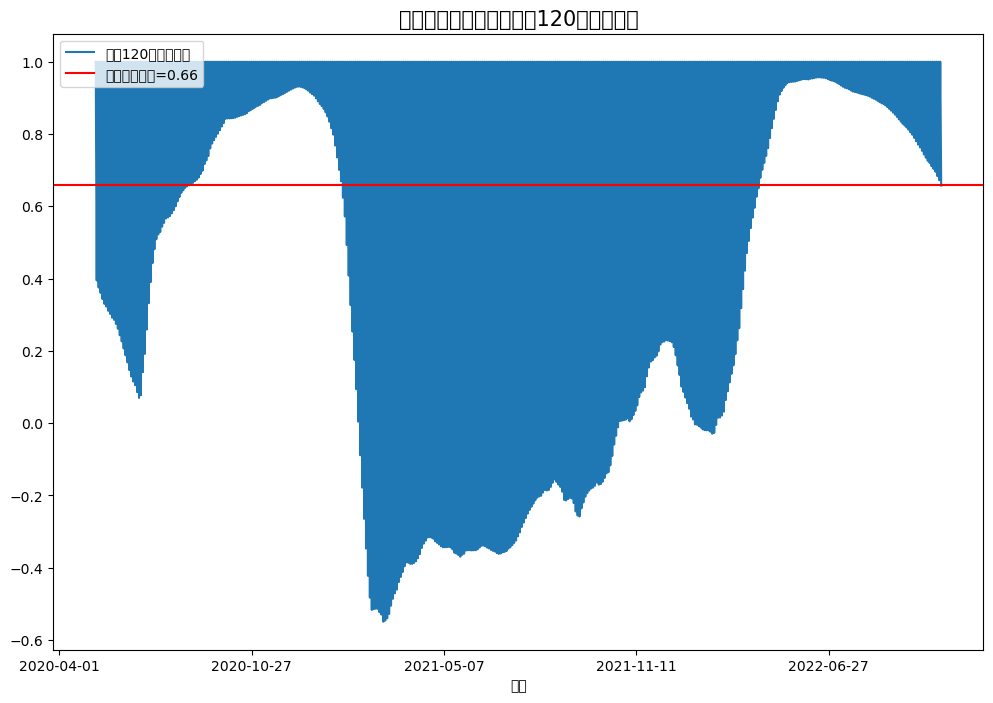

In [19]:
cal_roll_cor(data=index_data,index1='创业板指',index2='纳斯达克',period=120)

#### 描述性统计


In [26]:
def cal_ret_des(data=index_data,period='w'):
      data.index=pd.to_datetime(data.index)
      data=data.dropna()
      rets=(data/data.shift(1)-1)
      ret_m=rets.to_period(period) #Converts DatetimeArray/Index to PeriodArray/Index.
      ret_m = ret_m.groupby(ret_m.index).apply(lambda x:((1+x).cumprod()-1).iloc[-1])
      result=ret_m.describe().T
      result['skew']=ret_m.skew(axis=0)
      result['kurt']=ret_m.kurt(axis=0)
      #返回根据均值排序后数据
      return result.sort_values('mean',ascending=False)
cal_ret_des()


<IPython.core.display.Javascript object>

,count,mean,std,min,25%,50%,75%,max,skew,kurt
路透CRB商品指数,151.0,0.003670,0.033260,-0.101900,-0.011791,0.006409,0.021730,0.162192,0.450118,4.873173
印度孟买SENSEX,151.0,0.003487,0.030239,-0.170518,-0.011088,0.007673,0.018794,0.102398,-1.186481,7.760448
创业板指,151.0,0.003167,0.036682,-0.113047,-0.018002,0.004560,0.023030,0.146045,0.120883,1.369607
日经225,151.0,0.002301,0.031735,-0.159939,-0.009364,0.003017,0.017849,0.171366,0.050797,8.858408
台湾加权,151.0,0.001805,0.028878,-0.142911,-0.009287,0.005411,0.016497,0.117215,-1.046259,6.126331
标普500,151.0,0.001785,0.030589,-0.116941,-0.009671,0.005115,0.016224,0.129253,-0.409224,3.937571
中证500,151.0,0.001431,0.027534,-0.080826,-0.011096,0.001083,0.017099,0.117343,0.219784,1.834572
深证成指,151.0,0.001339,0.029503,-0.099918,-0.016976,0.002614,0.015909,0.114247,-0.071186,1.789654
韩国KOSPI,151.0,0.001303,0.034433,-0.177144,-0.013614,0.001938,0.016067,0.178432,-0.253330,10.007292
道琼斯,151.0,0.001275,0.031440,-0.133636,-0.009255,0.002409,0.014502,0.132540,-0.553804,5.201285


In [22]:
#月收益率
cal_ret_des(period='M')

<IPython.core.display.Javascript object>

,count,mean,std,min,25%,50%,75%,max,skew,kurt
路透CRB商品指数,38.0,0.015642,0.078984,-0.250846,-0.010699,0.029485,0.056032,0.222068,-0.804895,3.224108
印度孟买SENSEX,38.0,0.014170,0.063063,-0.258573,-0.013137,0.014674,0.049231,0.114496,-2.061025,8.536939
创业板指,38.0,0.013479,0.084934,-0.162377,-0.049757,0.011966,0.077978,0.168610,-0.087434,-0.570764
日经225,38.0,0.008585,0.053894,-0.138108,-0.024070,0.015786,0.044984,0.159619,-0.097448,1.635996
台湾加权,38.0,0.007040,0.055557,-0.140284,-0.021691,0.011640,0.047985,0.105270,-0.744602,0.686591
标普500,38.0,0.006939,0.058611,-0.132327,-0.031082,0.022481,0.040341,0.112659,-0.536736,-0.035264
中证500,38.0,0.005897,0.058460,-0.143274,-0.017549,0.009608,0.038889,0.121964,-0.507125,0.558337
深证成指,38.0,0.005610,0.063917,-0.136268,-0.023411,0.012800,0.042090,0.137215,-0.229339,0.014415
韩国KOSPI,38.0,0.004767,0.062810,-0.146115,-0.027990,0.014216,0.039108,0.161568,-0.408452,0.943111
道琼斯,38.0,0.004725,0.057374,-0.149398,-0.030901,0.015666,0.031671,0.128625,-0.535259,0.841446


In [23]:
#年收益率
cal_ret_des(period='Y')

<IPython.core.display.Javascript object>

,count,mean,std,min,25%,50%,75%,max,skew,kurt
创业板指,4.0,0.142684,0.365674,-0.267417,-0.012570,0.108978,0.264231,0.620196,0.539399,1.470302
路透CRB商品指数,4.0,0.140279,0.214521,-0.109708,0.034458,0.132576,0.238396,0.405672,0.199433,0.477924
印度孟买SENSEX,4.0,0.123284,0.087542,0.002174,0.099249,0.140257,0.164291,0.210448,-1.089844,2.011115
台湾加权,4.0,0.077636,0.242688,-0.279421,0.028391,0.174776,0.224020,0.240415,-1.784364,3.179818
日经225,4.0,0.073944,0.101451,-0.059078,0.022056,0.097374,0.149261,0.160105,-0.868841,-1.069695
标普500,4.0,0.071329,0.227568,-0.250205,0.009827,0.127530,0.189031,0.280461,-1.324555,2.234123
深证成指,4.0,0.058043,0.252701,-0.248341,-0.030681,0.055247,0.143970,0.370020,0.066137,1.446545
中证500,4.0,0.052096,0.172707,-0.182947,-0.023845,0.097676,0.173616,0.195979,-1.104431,0.175766
韩国KOSPI,4.0,0.047997,0.233626,-0.256948,-0.037045,0.070714,0.155757,0.307507,-0.559147,1.262228
美元指数,4.0,0.040229,0.110945,-0.074189,-0.030895,0.027315,0.098439,0.180473,0.540767,-0.971001


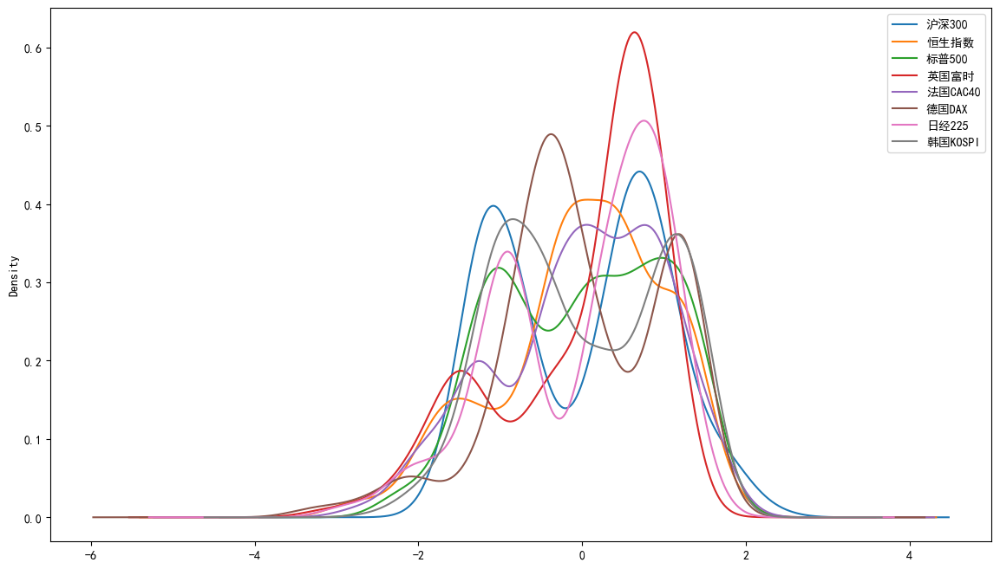

In [24]:
# 考虑各个指数点位差别较大，数据归一化或者标准化处理
def normalization(data,flag=True):
      data=data.dropna()
      if flag:
            return(data-data.min())/(data.max()-data.min())
      else:
            return(data-data.mean())/data.std()
from pylab import mpl
mpl.rcParams['font.sans-serif']=['SimHei']
mpl.rcParams['axes.unicode_minus']=False
cols2=['沪深300','恒生指数','标普500','英国富时','法国CAC40','德国DAX','日经225','韩国KOSPI']
data=normalization(index_data,flag=False)
data[cols2].plot(kind='kde',figsize=(14,8));